<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/6cat_val_ResNet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer learning and fine-tuning ResNet50

In [ ]:
FOLDER = '6cat_val'
!wget "http://mmoviles.upv.es/mascarillas/{FOLDER}.zip"
!unzip -qq -n {FOLDER}.zip


--2021-06-17 22:34:22--  http://mmoviles.upv.es/mascarillas/6cat_val.zip
Resolving mmoviles.upv.es (mmoviles.upv.es)... 158.42.250.56
Connecting to mmoviles.upv.es (mmoviles.upv.es)|158.42.250.56|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31735949 (30M) [application/zip]
Saving to: ‘6cat_val.zip’

6cat_val.zip        100%[===================>]  30.27M  1.50MB/s    in 21s     

2021-06-17 22:34:44 (1.41 MB/s) - ‘6cat_val.zip’ saved [31735949/31735949]



In [ ]:
from keras_preprocessing.image import ImageDataGenerator

BATCH_SIZE = 33
IMG_SIZE = (224, 224)

training_datagen = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=5,
      horizontal_flip=True)
train_generator = training_datagen.flow_from_directory(
	   FOLDER+'/training',
     batch_size=BATCH_SIZE,
     seed=9,
	   target_size=IMG_SIZE)

validation_datagen = ImageDataGenerator(
      rescale = 1./255)
validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+'/validation/',
    batch_size=BATCH_SIZE,
	  target_size=IMG_SIZE,
    shuffle=False,
    seed=9) 

Found 1000 images belonging to 6 classes.
Found 194 images belonging to 6 classes.


In [ ]:
from tensorflow import keras

base_model = keras.applications.ResNet50(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=IMG_SIZE+(3,),
    include_top=False, # Do not include the ImageNet classifier at the top.
)  
base_model.trainable = False # Freeze the base_model

inputs = keras.Input(shape=IMG_SIZE+(3,))
x = inputs
x = base_model(x, training=False)
#x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(512)(x)
x = keras.layers.Dropout(0.2)(x)  
outputs = keras.layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

94773248/94765736 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten (Flatten)            (None, 100352)            0         
_________________________________________________________________
dense (Dense)                (None, 512)               51380736  
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 3078      
Total params: 74,971,526
Trainable params: 51,383,814
Non-trai

In [ ]:
EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

Epoch 1/20
31/31 [==============================] - 29s 380ms/step - loss: 5.1669 - accuracy: 0.3210 - val_loss: 2.0789 - val_accuracy: 0.4845
Epoch 2/20
31/31 [==============================] - 11s 353ms/step - loss: 2.2405 - accuracy: 0.3560 - val_loss: 1.4395 - val_accuracy: 0.5000
Epoch 3/20
31/31 [==============================] - 11s 349ms/step - loss: 1.7780 - accuracy: 0.4150 - val_loss: 1.3702 - val_accuracy: 0.5412
Epoch 4/20
31/31 [==============================] - 11s 353ms/step - loss: 1.6101 - accuracy: 0.4380 - val_loss: 1.8620 - val_accuracy: 0.4381
Epoch 5/20
31/31 [==============================] - 11s 346ms/step - loss: 2.2537 - accuracy: 0.3960 - val_loss: 2.2715 - val_accuracy: 0.2423
Epoch 6/20
31/31 [==============================] - 11s 345ms/step - loss: 2.1243 - accuracy: 0.4040 - val_loss: 1.9655 - val_accuracy: 0.4639
Epoch 7/20
31/31 [==============================] - 11s 347ms/step - loss: 1.9760 - accuracy: 0.4740 - val_loss: 1.2994 - val_accuracy: 0.5361

acc:  [0.32100000977516174, 0.35600000619888306, 0.41499999165534973, 0.43799999356269836, 0.3959999978542328, 0.40400001406669617, 0.4740000069141388, 0.4580000042915344, 0.4779999852180481, 0.5329999923706055, 0.5289999842643738, 0.5569999814033508, 0.4880000054836273, 0.5130000114440918, 0.5699999928474426, 0.5529999732971191, 0.5410000085830688, 0.5529999732971191, 0.6110000014305115, 0.578000009059906]
val_acc:  [0.4845360815525055, 0.5, 0.5412371158599854, 0.438144326210022, 0.24226804077625275, 0.4639175236225128, 0.5360824465751648, 0.17525772750377655, 0.49484536051750183, 0.5979381203651428, 0.5824742317199707, 0.5567010045051575, 0.5206185579299927, 0.5, 0.623711347579956, 0.6340206265449524, 0.48969072103500366, 0.5876288414001465, 0.6391752362251282, 0.4329896867275238]
loss:  [5.166869163513184, 2.240489959716797, 1.7780165672302246, 1.6100547313690186, 2.253659963607788, 2.124282121658325, 1.9759891033172607, 1.8659480810165405, 1.7319624423980713, 1.5189136266708374, 1.

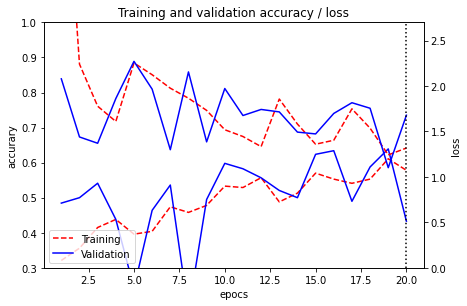

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=2.7)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

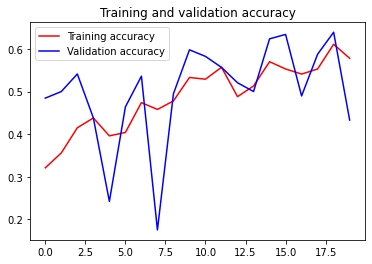

<Figure size 432x288 with 0 Axes>

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy2(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  #loss = history.history['loss']
  #val_loss = history.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'r', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend(loc=0)
  plt.figure()
  plt.show()

show_accuracy2(H)

## Fine-tuning of the entire model

In [ ]:
base_model.trainable = True

EPOCHS = 20
INIT_LR = 1e-5
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H2 = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

#Concatenamos historia de entrenamiento
H.history['loss'] = H.history['loss'] + H2.history['loss']
H.history['accuracy'] = H.history['accuracy'] + H2.history['accuracy']
H.history['val_loss'] = H.history['val_loss'] + H2.history['val_loss']
H.history['val_accuracy'] = H.history['val_accuracy'] + H2.history['val_accuracy']

Epoch 1/20
31/31 [==============================] - 19s 428ms/step - loss: 2.5546 - accuracy: 0.3940 - val_loss: 1.5825 - val_accuracy: 0.4330
Epoch 2/20
31/31 [==============================] - 13s 404ms/step - loss: 1.5217 - accuracy: 0.4460 - val_loss: 1.3886 - val_accuracy: 0.5000
Epoch 3/20
31/31 [==============================] - 13s 405ms/step - loss: 1.4009 - accuracy: 0.4940 - val_loss: 1.5040 - val_accuracy: 0.3505
Epoch 4/20
31/31 [==============================] - 13s 404ms/step - loss: 1.3446 - accuracy: 0.5170 - val_loss: 1.3103 - val_accuracy: 0.5103
Epoch 5/20
31/31 [==============================] - 13s 403ms/step - loss: 1.2437 - accuracy: 0.5730 - val_loss: 1.1410 - val_accuracy: 0.6186
Epoch 6/20
31/31 [==============================] - 13s 402ms/step - loss: 1.1712 - accuracy: 0.5760 - val_loss: 1.1970 - val_accuracy: 0.5773
Epoch 7/20
31/31 [==============================] - 13s 405ms/step - loss: 1.0858 - accuracy: 0.6260 - val_loss: 1.0582 - val_accuracy: 0.6443

acc:  [0.32100000977516174, 0.35600000619888306, 0.41499999165534973, 0.43799999356269836, 0.3959999978542328, 0.40400001406669617, 0.4740000069141388, 0.4580000042915344, 0.4779999852180481, 0.5329999923706055, 0.5289999842643738, 0.5569999814033508, 0.4880000054836273, 0.5130000114440918, 0.5699999928474426, 0.5529999732971191, 0.5410000085830688, 0.5529999732971191, 0.6110000014305115, 0.578000009059906, 0.39399999380111694, 0.44600000977516174, 0.49399998784065247, 0.5170000195503235, 0.5730000138282776, 0.5759999752044678, 0.6259999871253967, 0.6510000228881836, 0.6779999732971191, 0.6700000166893005, 0.6970000267028809, 0.6669999957084656, 0.7099999785423279, 0.6909999847412109, 0.6679999828338623, 0.703000009059906, 0.7279999852180481, 0.7379999756813049, 0.7129999995231628, 0.7379999756813049]
val_acc:  [0.4845360815525055, 0.5, 0.5412371158599854, 0.438144326210022, 0.24226804077625275, 0.4639175236225128, 0.5360824465751648, 0.17525772750377655, 0.49484536051750183, 0.5979381

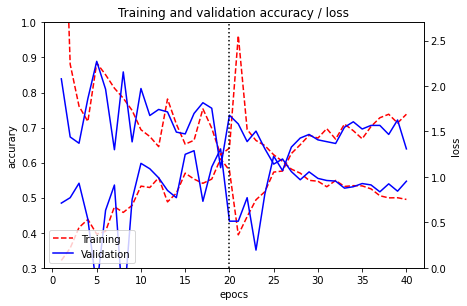

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=2.7)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

              precision    recall  f1-score   support

     GLASSES       0.22      0.22      0.22         9
    SIDE FIT       0.21      0.36      0.27        11
    NOSE OUT       0.60      0.86      0.71        28
          OK       0.73      0.67      0.70        89
    N.BRIDGE       0.60      0.38      0.46        32
     WITHOUT       0.92      0.88      0.90        25

    accuracy                           0.64       194
   macro avg       0.55      0.56      0.54       194
weighted avg       0.66      0.64      0.64       194



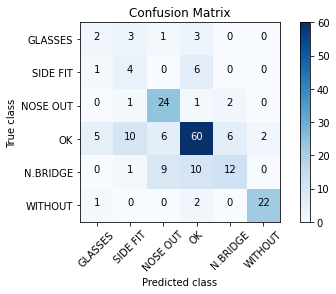

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

Found 194 images belonging to 6 classes.


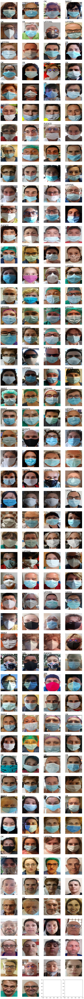

accuracy:  124 / 194  =  0.6391752577319587


In [ ]:
import numpy as np
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

NCOLS = 4 # número de columnas

#Visualiza los pimeros <number> imagenes, generadas desde datagen
#se clasifica cada imagen y en caso de error, se muestra la categoría asignada 
def show_generate_images(datagen, sample_number=None):
   if not isinstance(sample_number, (int) ): # Si no se indican cuantas 
      sample_number = datagen.samples        # se visualizan todas
   target_names = []                 # Obtenemos nombres de las clases 
   for key in datagen.class_indices:
      target_names.append(key)  
   nrows = -(-sample_number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))
   errors = 0
   i = 0
   for b in range( -(-sample_number // datagen.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
      x,y = datagen.next()
      for j in range(len(x)):
         if (i < sample_number):
            col = i % NCOLS
            row = i // NCOLS
            ax[row,col].axis('Off')  
            ax[row,col].imshow(x[j])
            y_pred = model.predict(x)[j]  # Verificamos error
            cat = np.argmax(y[j])
            cat_pred = np.argmax(y_pred) 
            if cat != cat_pred :
                ax[row,col].text(0, 0, target_names[cat_pred], fontsize=22)
                errors +=1
            i += 1
   plt.show()
   print("accuracy: ", sample_number-errors,"/",sample_number," = ", (sample_number-errors)/sample_number ) 

validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+"/validation/",
    batch_size=BATCH_SIZE,
	  target_size=(IMG_SIZE),
    shuffle=False)
validation_generator.reset()
show_generate_images(validation_generator)
